![banner](../../../docs/figs/brand_identity/banner.png)

![banner](../../../docs/figs/multimodal_llm_2/airbnb.png)

## 1. Load post and reviews data
just same old `pandas`

In [8]:
import pandas as pd

listings = 'data/listings.csv' # list of Airbnb posts
df_list = pd.read_csv(listings)
display(df_list)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,103760,https://www.airbnb.com/rooms/103760,20250621143218,2025-06-21,city scrape,Central Centre 5 min walk to/from Central MTR,"Located right in the heart of Central, this 2 ...",NaN,https://a0.muscache.com/pictures/815221/056993...,304876,...,4.63,4.72,4.41,NaN,f,1,1,0,0,1.85
1,248140,https://www.airbnb.com/rooms/248140,20250621143218,2025-06-21,city scrape,Bright Studio - Soho - Central HK,Our bright studio apartment is perfect for vis...,The local neighbourhood is quiet and relaxing....,https://a0.muscache.com/pictures/4e5463bc-38be...,1300549,...,4.97,4.75,4.79,NaN,f,1,1,0,0,1.36
2,263081,https://www.airbnb.com/rooms/263081,20250621143218,2025-06-21,city scrape,"3 睡房, 2500 平方呎 有工人 Family Friendly! 在中環半山 有車","Mid Level on the top of central, Next to the m...","We are in the most luxury area of HK, conduit ...",https://a0.muscache.com/pictures/7348025/73278...,1370155,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
3,306515,https://www.airbnb.com/rooms/306515,20250621143218,2025-06-21,city scrape,"HongKong,Central Bright Double Room",NaN,NaN,https://a0.muscache.com/pictures/3335548/00a8d...,1576511,...,4.84,4.89,4.79,NaN,f,1,1,0,0,0.12
4,378047,https://www.airbnb.com/rooms/378047,20250621143218,2025-06-21,city scrape,LUXURY HONG KONG COUNTRY COW SHED,Your bijoux getaway is a one story cottage in ...,"We are in the South Lantau foot hills, 20 min ...",https://a0.muscache.com/pictures/hosting/Hosti...,1805628,...,4.94,4.51,4.62,NaN,f,1,1,0,0,0.52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6969,1447523891847805372,https://www.airbnb.com/rooms/1447523891847805372,20250621143218,2025-06-21,city scrape,Master room Sheung wan,Located strategically in the heart of Sheung w...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,108719571,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
6970,1447645581445734114,https://www.airbnb.com/rooms/1447645581445734114,20250621143218,2025-06-21,city scrape,Ho Man Tin MTR 3-bedroom,You'll have a great time in this cozy place.,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,56570136,...,NaN,NaN,NaN,NaN,f,69,60,9,0,NaN
6971,1447685803669278103,https://www.airbnb.com/rooms/1447685803669278103,20250621143218,2025-06-21,city scrape,Urgent big room for rental,This is a rental property looking for long ter...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,665003816,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
6972,1447685836022951795,https://www.airbnb.com/rooms/1447685836022951795,20250621143218,2025-06-21,city scrape,5分鐘尖沙咀地鐵站雙人房，可以安排提早入住,Our hotel is located in the heart of Tsim Sha ...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,51187996,...,NaN,NaN,NaN,NaN,t,5,1,4,0,NaN


In [9]:
review_path = 'data/reviews.csv'
df_review = pd.read_csv(review_path)
display(df_review)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,103760,322244,2011-06-19,601908,Kathleen,We had a great experience staying in this apar...
1,103760,352385,2011-07-04,342534,Lynne,This apartment is in a fabulous location - wal...
2,103760,360538,2011-07-08,90756,Camille,Pretty good little apartment. Just a really gr...
3,103760,378028,2011-07-17,682631,Tan,The apartment was exactly the same as the phot...
4,103760,390313,2011-07-23,615474,Ann_Aun,The apartment is very clean and has everything...
...,...,...,...,...,...,...
109935,1442425564164938853,1448359611453284311,2025-06-21,702341148,梦茹,这家民宿绝对是我住过的最好的之一。它给人一种宾至如归的感觉从入住到离开，每一个环节都处理得非...
109936,1442822021870952450,1446123064608773280,2025-06-18,701546853,Dicky,The location and room were fantastic! It was i...
109937,1443966607231859758,1448282362393600258,2025-06-21,702404151,梦茹,"这次入住这家民宿是一次非常愉快的经历。民宿的位置十分便利,<br/>周边配套齐全。房间舒适温..."
109938,1446412092965226465,1448315047836947488,2025-06-21,702341148,梦茹,1、入住很快，房间也比较舒适，价格不贵，环境也不错，房间干净入住首选，满意。<br/>2、房...


## 2. Where's the data
`folium` makes it easy to visualize data that’s been manipulated in Python on an interactive leaflet map. It enables both the binding of data to a map for choropleth visualizations as well as passing rich vector/raster/HTML visualizations as markers on the map.

The library has a number of built-in tilesets from OpenStreetMap, Mapbox, etc, and supports custom tilesets. Folium supports both Image, Video, GeoJSON and TopoJSON overlays and has a number of vector layers built-in.

In [60]:
listings = pd.read_csv('data/listings.csv')

for idx, row in listings.iterrows():
    lat = row['latitude']
    lon = row['longitude']

pd.notna(lat)
True and False
row.get('name', 'N/A')

'暖居阁'

In [20]:
import folium
import geopandas as gpd

# Load neighbourhood boundaries from GeoJSON file
neighborhoods = gpd.read_file('data/neighbourhoods.geojson')
# Load Airbnb listings data
listings = pd.read_csv('data/listings.csv')

# Create map
center_lat, center_lon = 22.32, 114.17 # Set the initial map center coordinates to Hong Kong
m = folium.Map(
    location=[center_lat, center_lon], 
    zoom_start=11,
    tiles='Cartodb Positron'
)

# Add neighbourhood polygons to the map with styling
folium.GeoJson(
    neighborhoods,
    name='Neighbourhoods',
    tooltip=folium.GeoJsonTooltip(fields=['neighbourhood'], aliases=['Name:']),
    style_function=lambda feature: {
        'fillColor': 'white',  # White fill
        'color': 'blue',         # Blue boundary line
        'weight': 1,
        'fillOpacity': 0.1,      # Transparent fill
    }
).add_to(m)

# Plot each Airbnb listing as a red circle marker on the map
for idx, row in listings.iterrows(): # Iterate over DataFrame rows as (index, Series) pairs.
    lat = row['latitude']
    lon = row['longitude']
    if pd.notna(lat) and pd.notna(lon): # filter out missing values
        folium.CircleMarker(
            location=[lat, lon],
            radius=1,
            color='red',
            fill=True,
            fill_opacity=0.2,
            popup=f"Name: {row.get('name', 'N/A')}"  # Popup shows listing name. If 'name' doesn't exist, Python will return 'N/A'
        ).add_to(m)

# Add layer control to toggle neighbourhood polygons visibility
folium.LayerControl().add_to(m)
m

In [28]:
df_list['review_scores_rating'].dropna()

0       4.47
1       4.90
3       4.88
4       4.82
6       4.71
        ... 
6917    5.00
6919    5.00
6925    5.00
6957    5.00
6958    5.00
Name: review_scores_rating, Length: 3662, dtype: float64

## 3. How're the ratings?

A histogram `histplot` is a classic visualization tool that represents the distribution of one or more variables by **counting the number of observations** that fall within discrete bins(bars). It can normalize the statistic computed within each bin to estimate frequency, density or probability mass, and it can add a smooth curve obtained using a kernel density estimate

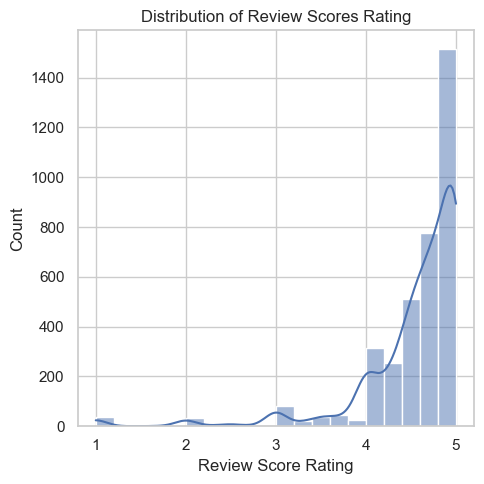

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Drop missing values in review_scores_rating
ratings = df_list['review_scores_rating'].dropna()

# Plot histogram
plt.figure(figsize=(5, 5))
sns.histplot(ratings, bins=20, kde=True)

plt.title("Distribution of Review Scores Rating")
plt.xlabel("Review Score Rating")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## 4. Structuring comments with LLM

### Initialize and test LLM

In [1]:
from ccai9012 import llm_utils, viz_utils

C:\Users\Joseph\anaconda3\envs\ccai9012\Lib\site-packages\diffusers\models\transformers\transformer_kandinsky.py:168: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  @torch.autocast(device_type="cuda", dtype=torch.float32)
C:\Users\Joseph\anaconda3\envs\ccai9012\Lib\site-packages\diffusers\models\transformers\transformer_kandinsky.py:272: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  @torch.autocast(device_type="cuda", dtype=torch.float32)


In [2]:
# Input API key
api_key = llm_utils.get_deepseek_api_key()

Enter your DEEPSEEK_API_KEY:  ········


In [3]:
# initialize LLM
llm = llm_utils.initialize_llm()

In [5]:
# Test connection
test = ["Is 9.9 or 9.11 bigger?"]
llm_utils.ask_llm(test)


📌 Prompt:
['Is 9.9 or 9.11 bigger?']

Let's compare the two numbers:  

**9.9** means 9 and 9 tenths, which is \( 9.90 \) if we write it with two decimal places.  
**9.11** means 9 and 11 hundredths, which is \( 9.11 \).  

Now compare digit by digit:  
- Both have 9 before the decimal point.  
- First decimal digit:  
  - 9.9 → first decimal digit is **9** (tenths place).  
  - 9.11 → first decimal digit is **1** (tenths place).  

Since \( 9 > 1 \), we already know **9.9 is bigger** without needing to check further.  

\[
9.9 > 9.11
\]

**Answer:** 9.9 is bigger.



### Test (small batch)

In [10]:
test_csv = "output/test.csv"
test = df_review[:5]
test_result = llm_utils.analyze_airbnb_reviews(test, llm, test_csv, max_reviews=5) # maybe explain how analyze_airbnb_reviews works

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:34<00:00,  6.87s/it]


Saved 5 analyzed reviews to output/test.csv


In [11]:
test

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,103760,322244,2011-06-19,601908,Kathleen,We had a great experience staying in this apar...
1,103760,352385,2011-07-04,342534,Lynne,This apartment is in a fabulous location - wal...
2,103760,360538,2011-07-08,90756,Camille,Pretty good little apartment. Just a really gr...
3,103760,378028,2011-07-17,682631,Tan,The apartment was exactly the same as the phot...
4,103760,390313,2011-07-23,615474,Ann_Aun,The apartment is very clean and has everything...


In [10]:
test_result

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment
0,103760,352385,2011-07-04,This apartment is in a fabulous location - wal...,positive,"great location, spotlessly clean, flexible hos...",positive,Fabulous location walkable to SoHo and right o...,positive,Place was spotlessly clean and good for afford...,positive,Brendan was very easy to deal with and flexibl...
1,103760,390313,2011-07-23,The apartment is very clean and has everything...,positive,"clean apartment, excellent location, well-equi...",positive,Safe and super convenient with multiple transp...,positive,"Well-organized with stable internet, working a...",positive,Guest would definitely stay again at Brendan's...
2,103760,360538,2011-07-08,Pretty good little apartment. Just a really gr...,positive,"great location, comfortable beds, AC in all ro...",positive,Really great location,positive,"Comfortable beds and AC in all rooms, apartmen...",neutral,No specific mention of host interaction
3,103760,322244,2011-06-19,We had a great experience staying in this apar...,positive,"convenient location, clean apartment, flexible...",positive,Most convenient location in Central with a gre...,positive,"Very clean, quiet, with good wifi and televisi...",positive,"Very flexible and kind, allowing luggage stora..."
4,103760,378028,2011-07-17,The apartment was exactly the same as the phot...,positive,"clean apartment, accurate photos, good wifi, c...",neutral,No specific mention of location in the review,positive,"Clean, cozy, good wifi, well-equipped though s...",neutral,No specific mention of host interaction in the...


### All results (full batch)

In [13]:
airbnb_csv = "output/airbnb_reviews.csv"
all_result = llm_utils.analyze_airbnb_reviews(df_review, llm, airbnb_csv, max_reviews=150) # looking into 'comments'

100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [11:48<00:00,  4.72s/it]


Saved 150 analyzed reviews to output/airbnb_reviews.csv


In [28]:
all_result

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment
0,858590791586915213,1359897611805031041,2025-02-19,"Great stay, good location. Convenient",positive,"good location, convenient, great stay",positive,Good and convenient location,neutral,No specific mention of facilities,neutral,No specific mention of the host
1,21165998,329469862,2018-09-29,Very convenient location. Host was kind enough...,positive,"convenient location, kind host, free upgrade, ...",positive,Very convenient with awesome restaurants on th...,neutral,"Space is a bit crammed, which is typical for H...",positive,Kind enough to provide a free upgrade.
2,6348825,177165456,2017-08-02,除左细其他都ok,neutral,"small room, acceptable overall, compact space,...",neutral,No specific mention of location in the review.,negative,The room is described as small (除左细).,neutral,No specific mention of the host in the review.
3,1328286909959687741,1419296659137513228,2025-05-12,This is just like home away from home.... loca...,positive,"family-friendly, well-equipped kitchen, great ...",positive,Perfect location with everything around the pr...,positive,Well-equipped kitchen that helped save money o...,positive,Very helpful and responsive to every question.
4,31662448,705385625912739295,2022-08-31,Felt good. Rela made Indonesian rib soup and d...,positive,"friendly host, good location, home-cooked food...",positive,"House is in a good location, convenient for sh...",neutral,No specific mention of facilities in the review.,positive,Host Rela made Indonesian rib soup and dumplin...
...,...,...,...,...,...,...,...,...,...,...,...,...
145,868477717623572749,1126519461770304071,2024-04-03,非常舒適的環境，非常推薦,positive,"comfortable environment, highly recommended, p...",neutral,No specific mention of location in the review.,positive,The environment is described as very comfortable.,neutral,No specific mention of the host in the review.
146,880286248297903810,897529016686942387,2023-05-23,"房東姐姐非常Nice,人也很好,位置也蠻好的,交通也很方便,房屋乾淨靚麗！下次還會繼續選擇這...",positive,"friendly host, convenient location, clean acco...",positive,位置蠻好，交通很方便,positive,房屋乾淨靚麗,positive,房東姐姐非常Nice，人也很好
147,1039461007747208417,1314904142374860991,2024-12-19,Great location to travel around in Hong Kong.,positive,"great location, convenient for travel, explore...",positive,Great for traveling around Hong Kong.,neutral,No specific mention of facilities in the review.,neutral,No specific mention of the host in the review.
148,1065780526744493882,1166404331784459508,2024-05-28,It was my 2nd time staying at Helen’s in 2024....,positive,"clean and stylish, great host, decent view and...",neutral,No specific location details mentioned beyond ...,positive,"Clean, stylish, with a decent view, patio, and...",positive,"Helen provides sweet welcoming notes, continuo..."


In [33]:
type(all_result)

pandas.DataFrame

In [15]:
all_result.columns

Index(['listing_id', 'review_id', 'date', 'review_text', 'overall_impression',
       'decision_tags', 'location_opinion', 'location_comment',
       'facility_opinion', 'facility_comment', 'host_opinion', 'host_comment'],
      dtype='str')

## 5. Plot heatmap for aspect-wise impression

In [24]:
import folium

def plot_review_map(df, sentiment_field, map_center=[22.3193, 114.1694], zoom=12):

    # Define color mapping
    impression_color = {
        'positive': 'green',
        'neutral': 'yellow',
        'negative': 'red'
    }

    # Create map
    m = folium.Map(location=map_center, zoom_start=zoom, tiles="CartoDB positron")

    # Plot each review
    for _, row in df.iterrows():
        lat, lon = row.get('latitude'), row.get('longitude')
        sentiment = row.get(sentiment_field, 'neutral')
        color = impression_color.get(sentiment, 'gray')

        if pd.notna(lat) and pd.notna(lon):
            folium.CircleMarker(
                location=[lat, lon],
                radius=4,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7,
                popup=f"{sentiment_field}: {sentiment}"
            ).add_to(m)

    return m

In [17]:
# Merge llm result with airbnb location info
all_result = pd.read_csv("output/airbnb_reviews.csv")
listing_df = pd.read_csv("data/listings.csv")
df = all_result.merge(
    listing_df[['id', 'latitude', 'longitude']], 
    left_on='listing_id',
    right_on='id',
    how='left'
)
df

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment,id,latitude,longitude
0,858590791586915213,1359897611805031041,2025-02-19,"Great stay, good location. Convenient",positive,"good location, convenient, great stay",positive,Good and convenient location,neutral,No specific mention of facilities,neutral,No specific mention of the host,858590791586915213,22.278941,114.178875
1,21165998,329469862,2018-09-29,Very convenient location. Host was kind enough...,positive,"convenient location, kind host, free upgrade, ...",positive,Very convenient with awesome restaurants on th...,neutral,"Space is a bit crammed, which is typical for H...",positive,Kind enough to provide a free upgrade.,21165998,22.317020,114.170670
2,6348825,177165456,2017-08-02,除左细其他都ok,neutral,"small room, acceptable overall, compact space,...",neutral,No specific mention of location in the review.,negative,The room is described as small (除左细).,neutral,No specific mention of the host in the review.,6348825,22.316810,114.169680
3,1328286909959687741,1419296659137513228,2025-05-12,This is just like home away from home.... loca...,positive,"family-friendly, well-equipped kitchen, great ...",positive,Perfect location with everything around the pr...,positive,Well-equipped kitchen that helped save money o...,positive,Very helpful and responsive to every question.,1328286909959687741,22.321130,114.167790
4,31662448,705385625912739295,2022-08-31,Felt good. Rela made Indonesian rib soup and d...,positive,"friendly host, good location, home-cooked food...",positive,"House is in a good location, convenient for sh...",neutral,No specific mention of facilities in the review.,positive,Host Rela made Indonesian rib soup and dumplin...,31662448,22.279270,114.180960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,868477717623572749,1126519461770304071,2024-04-03,非常舒適的環境，非常推薦,positive,"comfortable environment, highly recommended, p...",neutral,No specific mention of location in the review.,positive,The environment is described as very comfortable.,neutral,No specific mention of the host in the review.,868477717623572749,22.276530,114.172698
146,880286248297903810,897529016686942387,2023-05-23,"房東姐姐非常Nice,人也很好,位置也蠻好的,交通也很方便,房屋乾淨靚麗！下次還會繼續選擇這...",positive,"friendly host, convenient location, clean acco...",positive,位置蠻好，交通很方便,positive,房屋乾淨靚麗,positive,房東姐姐非常Nice，人也很好,880286248297903810,22.323183,114.160332
147,1039461007747208417,1314904142374860991,2024-12-19,Great location to travel around in Hong Kong.,positive,"great location, convenient for travel, explore...",positive,Great for traveling around Hong Kong.,neutral,No specific mention of facilities in the review.,neutral,No specific mention of the host in the review.,1039461007747208417,22.306468,114.166632
148,1065780526744493882,1166404331784459508,2024-05-28,It was my 2nd time staying at Helen’s in 2024....,positive,"clean and stylish, great host, decent view and...",neutral,No specific location details mentioned beyond ...,positive,"Clean, stylish, with a decent view, patio, and...",positive,"Helen provides sweet welcoming notes, continuo...",1065780526744493882,22.282930,114.128270


In [36]:
df.columns

Index(['listing_id', 'review_id', 'date', 'review_text', 'overall_impression',
       'decision_tags', 'location_opinion', 'location_comment',
       'facility_opinion', 'facility_comment', 'host_opinion', 'host_comment',
       'id', 'latitude', 'longitude'],
      dtype='str')

In [38]:
df[['latitude', 'longitude','overall_impression','location_opinion','facility_opinion','host_opinion']]

,latitude,longitude,overall_impression,location_opinion,facility_opinion,host_opinion
0,22.278941,114.178875,positive,positive,neutral,neutral
1,22.317020,114.170670,positive,positive,neutral,positive
2,22.316810,114.169680,neutral,neutral,negative,neutral
3,22.321130,114.167790,positive,positive,positive,positive
4,22.279270,114.180960,positive,positive,neutral,positive
...,...,...,...,...,...,...
145,22.276530,114.172698,positive,neutral,positive,neutral
146,22.323183,114.160332,positive,positive,positive,positive
147,22.306468,114.166632,positive,positive,neutral,neutral
148,22.282930,114.128270,positive,neutral,positive,positive


In [27]:
# overall impression
plot_review_map(df, sentiment_field='overall_impression')

In [21]:
# location impression
plot_review_map(df, sentiment_field='location_opinion')

In [22]:
# facility impression
plot_review_map(df, sentiment_field='facility_opinion')

In [23]:
# host impression
plot_review_map(df, sentiment_field='host_opinion')

## 6. What do renters care about?
In a `wordcloud`, the importance of each word is shown with font size or color.

We are using font size here: Larger words appeared more frequently; smaller words appeared less often.

In [54]:
df[['decision_tags','overall_impression','location_opinion','facility_opinion','host_opinion']]

,decision_tags,overall_impression,location_opinion,facility_opinion,host_opinion
0,"good location, convenient, great stay",positive,positive,neutral,neutral
1,"convenient location, kind host, free upgrade, ...",positive,positive,neutral,positive
2,"small room, acceptable overall, compact space,...",neutral,neutral,negative,neutral
3,"family-friendly, well-equipped kitchen, great ...",positive,positive,positive,positive
4,"friendly host, good location, home-cooked food...",positive,positive,neutral,positive
...,...,...,...,...,...
145,"comfortable environment, highly recommended, p...",positive,neutral,positive,neutral
146,"friendly host, convenient location, clean acco...",positive,positive,positive,positive
147,"great location, convenient for travel, explore...",positive,positive,neutral,neutral
148,"clean and stylish, great host, decent view and...",positive,neutral,positive,positive


### Overall impression

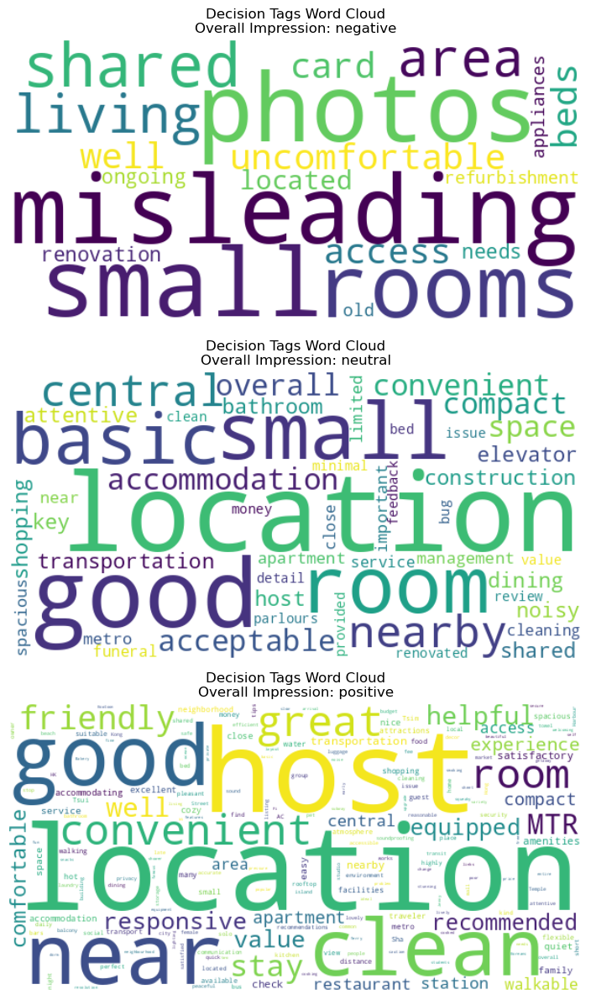

In [39]:
viz_utils.plot_wordclouds(all_result) # uses wordcloud, takes in 'overall_impression', 'decision_tags'

### Location

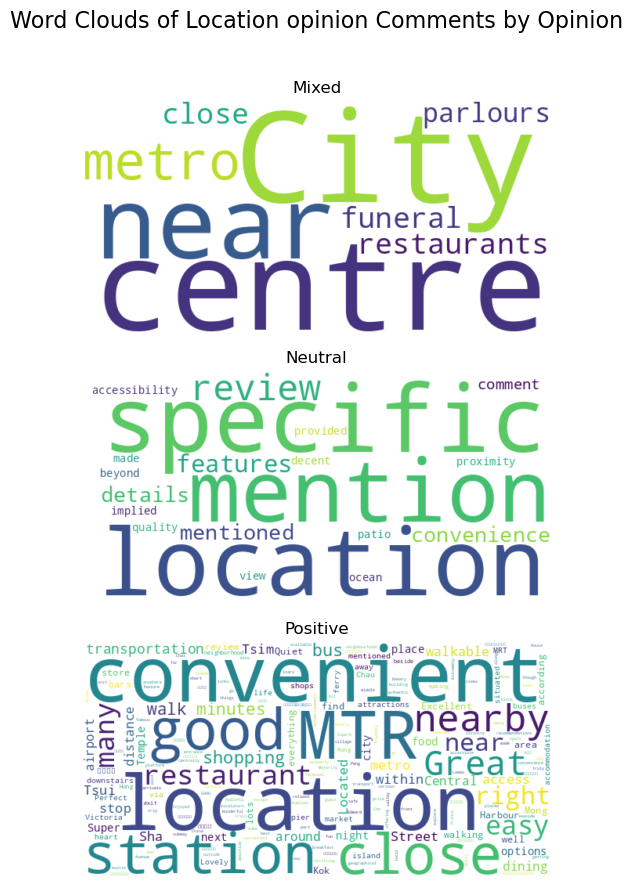

In [43]:
viz_utils.plot_wordclouds_by_aspect_opinion(all_result, ['location_opinion'])

### Facilities

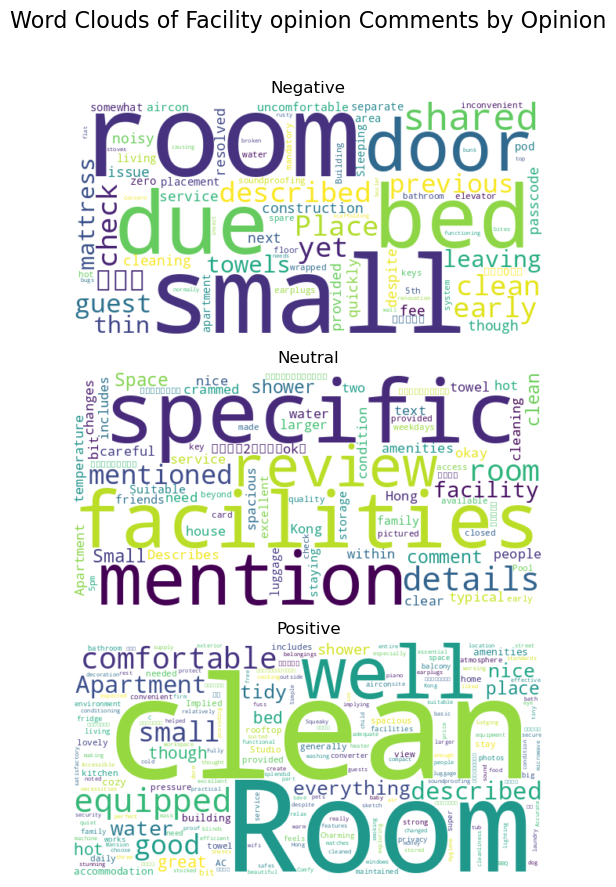

In [55]:
viz_utils.plot_wordclouds_by_aspect_opinion(all_result, ['facility_opinion'])

### Host

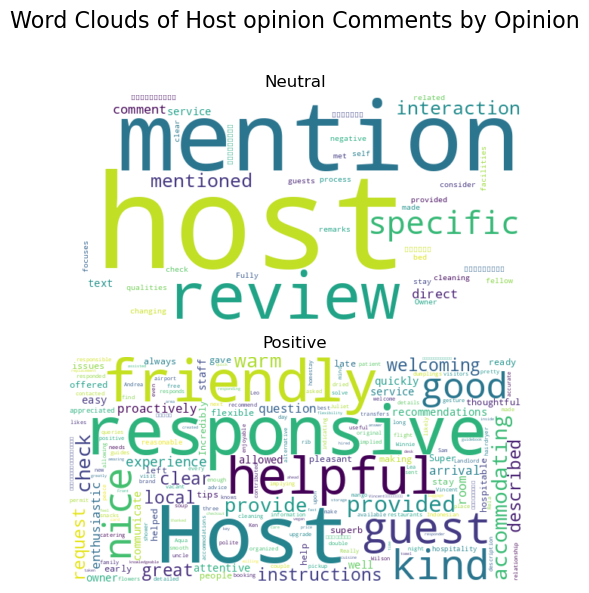

In [56]:
viz_utils.plot_wordclouds_by_aspect_opinion(all_result, ['host_opinion'])

# Give me rent!